# Object detection in Visdrone dataset (EDA)

## Import Libraries

In [8]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
from tqdm import tqdm

## Define the dataset paths

In [9]:
train_dir = "/home/sai/drone_ws/src/visdrone_object_detection/data/VisImages/VisDrone2019-DET-train"  # Adjust this path
images_dir = os.path.join(train_dir, "images")
labels_dir = os.path.join(train_dir, "labels")

## Modified Visdrone dataset classes

In [10]:
visdrone_classes = {
    0: 'people',
    1: 'bicycle',
    2: 'car',  
    3: 'truck',
    4: 'bus',
    5: 'motor'
}

## Util functions

In [11]:
def load_dataset(images_dir, labels_dir):
    data = []
    label_files = list(Path(labels_dir).glob('*.txt'))
    print(f"Loading {len(label_files)} annotation files...")
    for label_file in tqdm(label_files):
        img_file = Path(images_dir) / f"{label_file.stem}.jpg"
        if not img_file.exists():
            print(f"Warning: Image not found for {label_file.name}")
            continue
        img_width, img_height = Image.open(img_file).size
        
        with open(label_file, 'r') as f:
            for line in f:
                try:
                    cls, x_center, y_center, width, height = map(float, line.strip().split())
                    # Validate dimensions
                    if width <= 0 or height <= 0:
                        continue
                    abs_width = width * img_width
                    abs_height = height * img_height
                    abs_x = x_center * img_width
                    abs_y = y_center * img_height
                    # Additional validation checks
                    if abs_width <= 0 or abs_height <= 0:
                        continue
                    data.append({
                        'image': label_file.stem,
                        'class': int(cls),
                        'class_name': visdrone_classes.get(int(cls), f'unknown_{int(cls)}'),
                        'width': abs_width,
                        'height': abs_height,
                        'area': abs_width * abs_height,
                        'aspect_ratio': abs_width / abs_height,
                        'x_center': abs_x,
                        'y_center': abs_y,
                        'image_width': img_width,
                        'image_height': img_height
                    })
                except ValueError as e:
                    print(f"Warning: Error processing line in {label_file.name}: {line}")
                    continue
    
    return pd.DataFrame(data)

## Analysis of Train Dataset

In [12]:
df = load_dataset(images_dir, labels_dir)

Loading 6471 annotation files...


100%|██████████| 6471/6471 [00:03<00:00, 2092.30it/s]


### Basic statistics

In [13]:
df.head()

,image,class,class_name,width,height,area,aspect_ratio,x_center,y_center,image_width,image_height
0,9999981_00000_d_0000082,0,people,13.0004,15.00030,195.00990,0.866676,641.4996,832.49985,1400,1050
1,9999981_00000_d_0000082,5,motor,21.0000,18.00015,378.00315,1.166657,774.4996,795.00015,1400,1050
2,9999981_00000_d_0000082,0,people,10.9998,13.99965,153.99335,0.785720,852.5006,771.00030,1400,1050
3,9999981_00000_d_0000082,0,people,23.0006,20.00040,460.02120,1.150007,848.4994,690.00015,1400,1050
4,9999981_00000_d_0000082,5,motor,27.0004,34.00005,918.01495,0.794128,762.5002,685.99965,1400,1050


In [14]:
print(f"Total number of images: {df['image'].nunique():,}")
print(f"Total number of objects: {len(df):,}")
print(f"Number of classes: {df['class'].nunique()}")

Total number of images: 6,471
Total number of objects: 335,146
Number of classes: 6


### Objects per image statistics

In [15]:
objects_per_image = df.groupby('image').size()
print(f"\nObjects per image:")
print(f"Mean: {objects_per_image.mean():.1f}")
print(f"Median: {objects_per_image.median():.1f}")
print(f"Min: {objects_per_image.min()}")
print(f"Max: {objects_per_image.max()}")


Objects per image:
Mean: 51.8
Median: 41.0
Min: 1
Max: 898


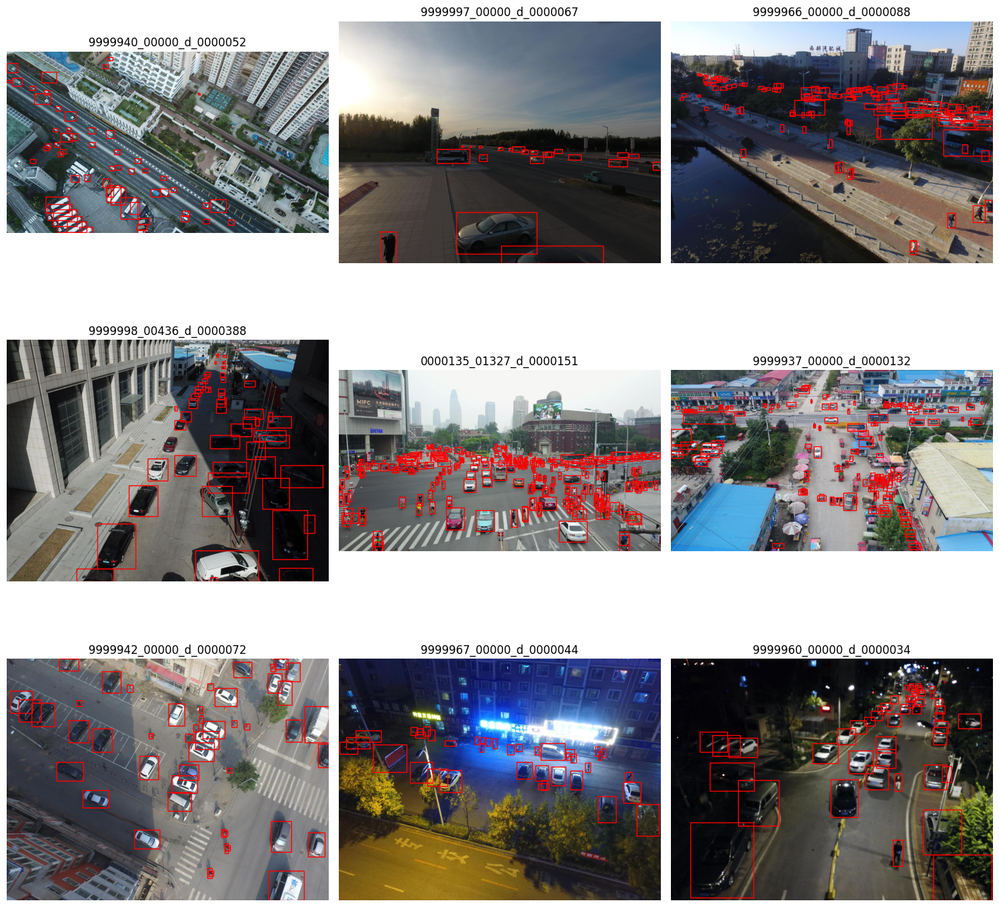

In [16]:
# Sample 9 random images
sample_images = df['image'].sample(9).unique()

plt.figure(figsize=(15, 15))
for i, img_name in enumerate(sample_images):
    img_path = Path(images_dir) / f"{img_name}.jpg"
    img = Image.open(img_path)
    ax = plt.subplot(3, 3, i + 1)
    ax.imshow(img)
    bboxes = df[df['image'] == img_name]
    for _, bbox in bboxes.iterrows():
        rect = plt.Rectangle(
            ((bbox['x_center'] - bbox['width'] / 2), (bbox['y_center'] - bbox['height'] / 2)),
            bbox['width'],
            bbox['height'],
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title(img_name)
    ax.axis('off')
plt.tight_layout()
plt.show()

### Class distribution

In [17]:
class_dist = df['class'].value_counts().sort_index()
total_objects = len(df)

print("\nClass Distribution Analysis:")
print("-" * 70)
print(f"{'Class ID':<8} {'Class Name':<15} {'Count':>10} {'Percentage':>12}")
print("-" * 70)

for cls, count in class_dist.items():
    percentage = (count / total_objects) * 100
    class_name = visdrone_classes.get(cls, 'unknown')
    print(f"{cls:<8} {class_name:<15} {count:>10,} {percentage:>11.1f}%")

print("-" * 70)
print(f"{'Total':<24} {total_objects:>10,} {100:>11.1f}%")


Class Distribution Analysis:
----------------------------------------------------------------------
Class ID Class Name           Count   Percentage
----------------------------------------------------------------------
0        people             106,396        31.7%
1        bicycle             10,480         3.1%
2        car                169,822        50.7%
3        truck               12,875         3.8%
4        bus                  5,926         1.8%
5        motor               29,647         8.8%
----------------------------------------------------------------------
Total                       335,146       100.0%


## Class Distribution Plot

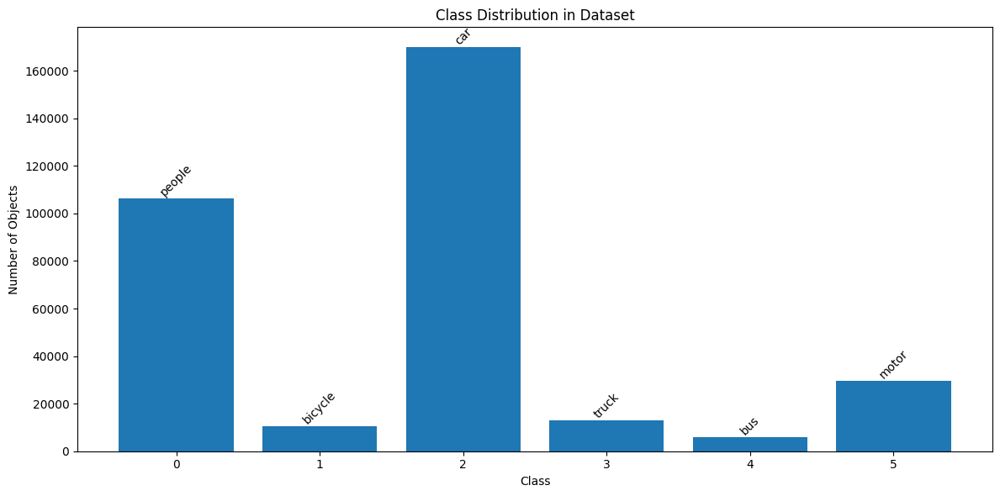

In [18]:
plt.figure(figsize=(12, 6))
bars = plt.bar(class_dist.index, class_dist.values)
plt.title('Class Distribution in Dataset')
plt.xlabel('Class')
plt.ylabel('Number of Objects')

# Add class names as labels
for i, bar in enumerate(bars):
    class_name = visdrone_classes.get(i, f'Class {i}')
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
            class_name, ha='center', va='bottom', rotation=45)
plt.tight_layout()
plt.show()

## Aspect Ratio Distribution by Class

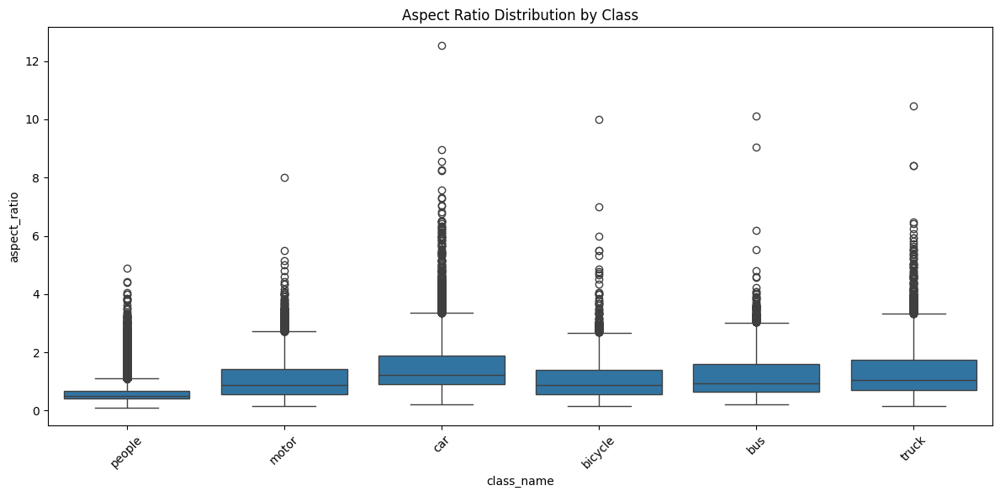

In [19]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='class_name', y='aspect_ratio', data=df)
plt.title('Aspect Ratio Distribution by Class')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [20]:
print('mean:', objects_per_image.mean())
print('median:', objects_per_image.median())
print('min:', objects_per_image.min())
print('max:', objects_per_image.max())

mean: 51.791995054860145
median: 41.0
min: 1
max: 898


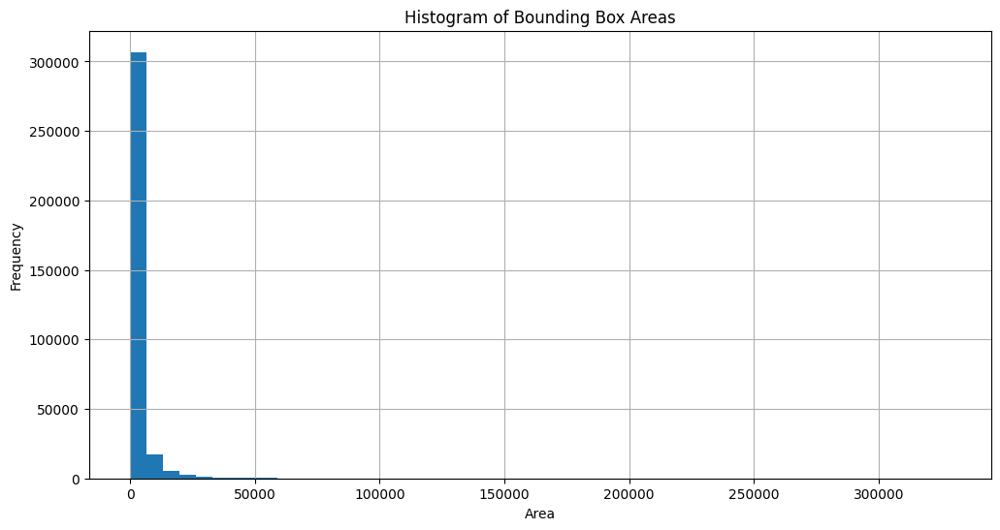

In [21]:
plt.figure(figsize=(12, 6))
df['area'].hist(bins=50)
plt.title('Histogram of Bounding Box Areas')
plt.xlabel('Area')
plt.ylabel('Frequency')
plt.show()

In [22]:
print("Area Analysis:")
print("-" * 70)
print(df["area"].describe())

Area Analysis:
----------------------------------------------------------------------
count    335146.000000
mean       2442.565144
std        6633.332434
min           2.999000
25%         240.006360
50%         666.985500
75%        1999.968000
max      328640.208000
Name: area, dtype: float64


### plot very small images

In [23]:
def count_low_area_bboxes_yolo(images_dir, labels_dir, threshold=100):
    """
    Count the number of images that have bounding boxes with very low area in YOLO format
    and store it as a pandas dataframe along with the image name and their bounding boxes.

    Parameters:
    images_dir (str): Directory containing images.
    labels_dir (str): Directory containing label files.
    threshold (float): Area threshold to consider as low area. Default is 100.

    Returns:
    pd.DataFrame: DataFrame containing image names and their bounding boxes with low area.
    """
    low_area_data = []
    label_files = list(Path(labels_dir).glob('*.txt'))
    print(f"Processing {len(label_files)} annotation files...")

    for label_file in tqdm(label_files):
        img_file = Path(images_dir) / f"{label_file.stem}.jpg"
        if not img_file.exists():
            print(f"Warning: Image not found for {label_file.name}")
            continue

        img_width, img_height = Image.open(img_file).size

        with open(label_file, 'r') as f:
            for line in f:
                try:
                    cls, x_center, y_center, width, height = map(float, line.strip().split())
                    abs_width = width * img_width
                    abs_height = height * img_height
                    area = abs_width * abs_height

                    if area < threshold:
                        low_area_data.append({
                            'image': label_file.stem,
                            'class': int(cls),
                            'x_center': x_center,
                            'y_center': y_center,
                            'width': width,
                            'height': height,
                            'area': area
                        })
                        break  # No need to check further boxes for this image
                except ValueError as e:
                    print(f"Warning: Error processing line in {label_file.name}: {line}")
                    continue

    low_area_df = pd.DataFrame(low_area_data)
    print(f"Number of images with low area bounding boxes: {len(low_area_df['image'].unique())}")
    return low_area_df

# Example usage
low_area_df = count_low_area_bboxes_yolo(images_dir, labels_dir)

Processing 6471 annotation files...


100%|██████████| 6471/6471 [00:01<00:00, 5838.28it/s]


Number of images with low area bounding boxes: 3056


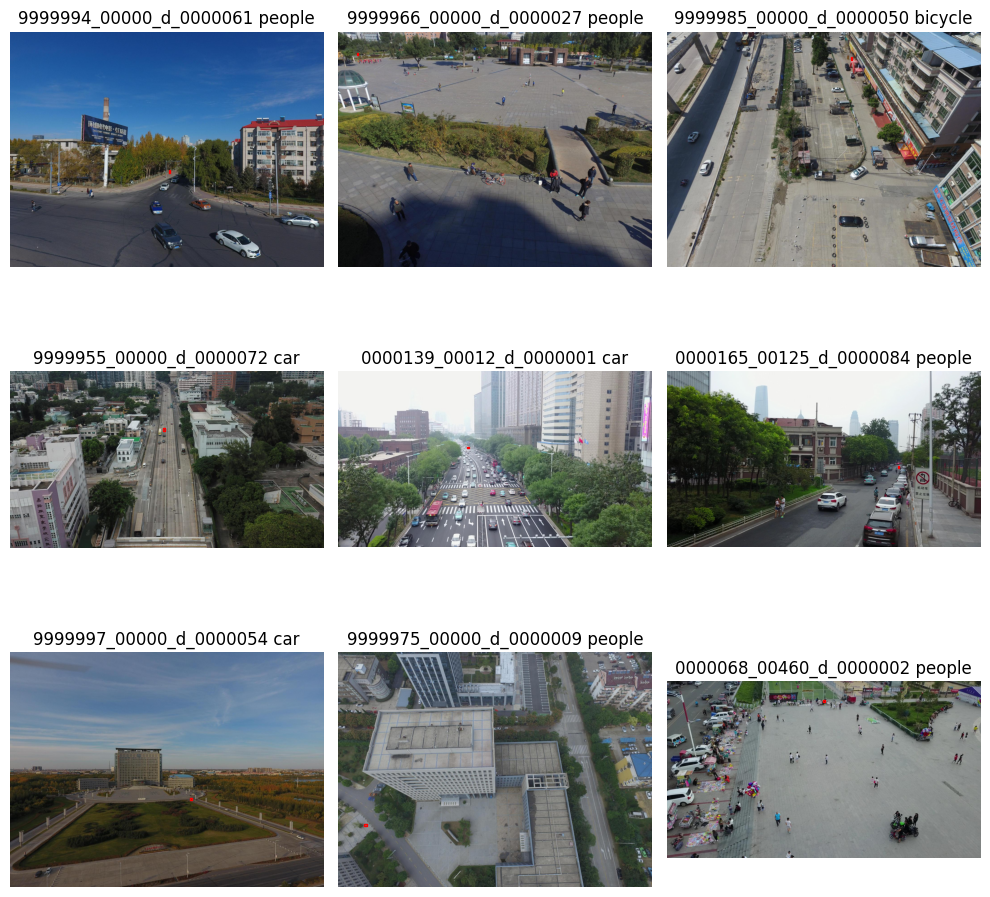

In [24]:
# Plot 9 random images with their bounding boxes
sample_images = low_area_df['image'].sample(9).unique()

plt.figure(figsize=(10, 10))
for i, img_name in enumerate(sample_images):
    img_path = Path(images_dir) / f"{img_name}.jpg"
    img = Image.open(img_path)
    ax = plt.subplot(3, 3, i + 1)
    ax.imshow(img)
    bboxes = low_area_df[low_area_df['image'] == img_name]
    for _, bbox in bboxes.iterrows():
        rect = plt.Rectangle(
            ((bbox['x_center'] - bbox['width'] / 2) * img.width, (bbox['y_center'] - bbox['height'] / 2) * img.height),
            bbox['width'] * img.width,
            bbox['height'] * img.height,
            edgecolor='red',
            facecolor='none'
        )
        ax.add_patch(rect)
    ax.set_title(img_name + " " + visdrone_classes.get(int(bbox['class']), f'unknown_{int(bbox["class"])}'))
    ax.axis('off')
plt.tight_layout()
plt.show()

### plot images with specific class

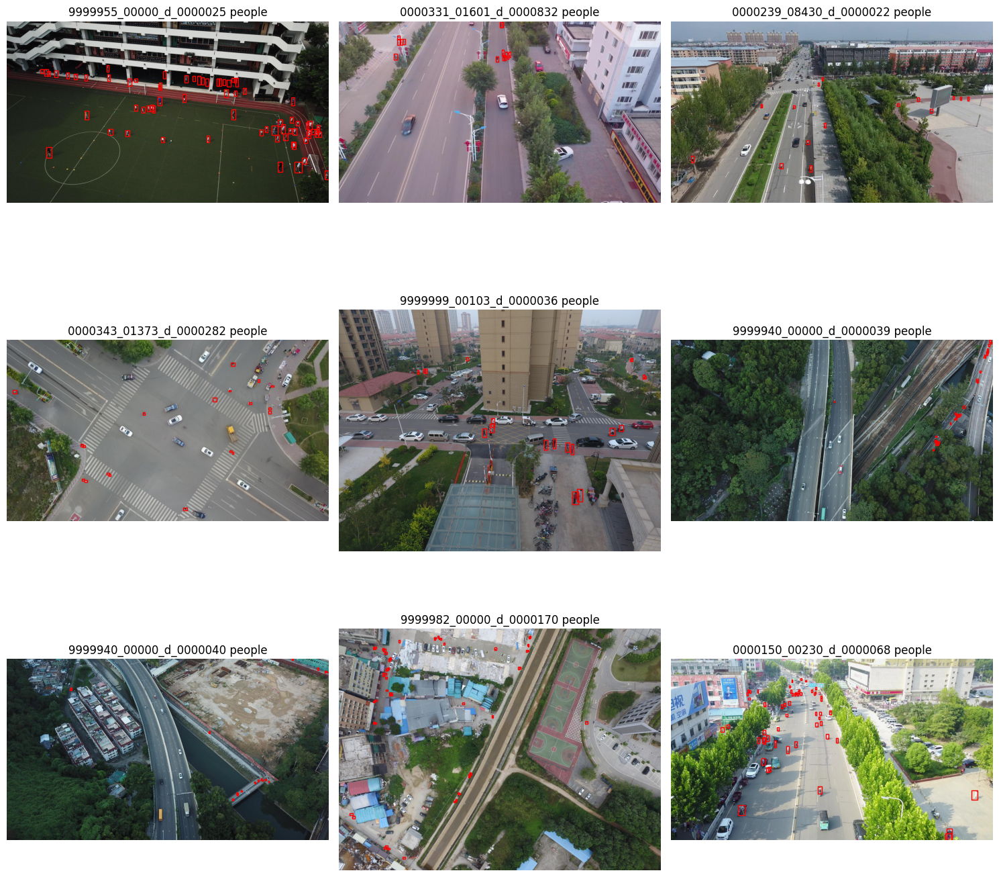

In [25]:
def plot_images_for_class(df, class_name, images_dir, visdrone_classes, num_images=9):
    # Filter the dataframe for the given class name
    class_df = df[df['class_name'] == class_name]
    
    # Sample images
    sample_images = class_df['image'].sample(num_images).unique()
    
    plt.figure(figsize=(15, 15))
    for i, img_name in enumerate(sample_images):
        img_path = Path(images_dir) / f"{img_name}.jpg"
        img = Image.open(img_path)
        ax = plt.subplot(3, 3, i + 1)
        ax.imshow(img)
        bboxes = class_df[class_df['image'] == img_name]
        for _, bbox in bboxes.iterrows():
            rect = plt.Rectangle(
                ((bbox['x_center'] - bbox['width'] / 2), (bbox['y_center'] - bbox['height'] / 2)),
                bbox['width'],
                bbox['height'],
                edgecolor='red',
                facecolor='none'
            )
            ax.add_patch(rect)
        ax.set_title(f"{img_name} {class_name}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Example usage
plot_images_for_class(df,'people', images_dir, visdrone_classes)

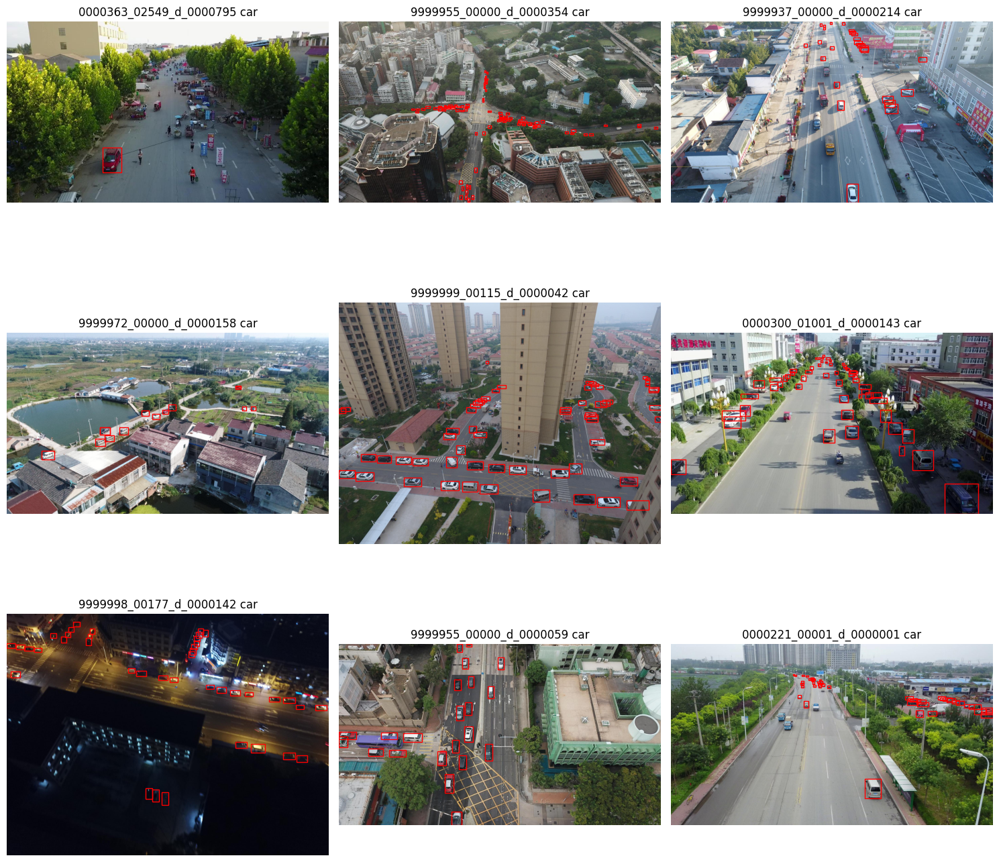

In [26]:
plot_images_for_class(df,'car', images_dir, visdrone_classes)

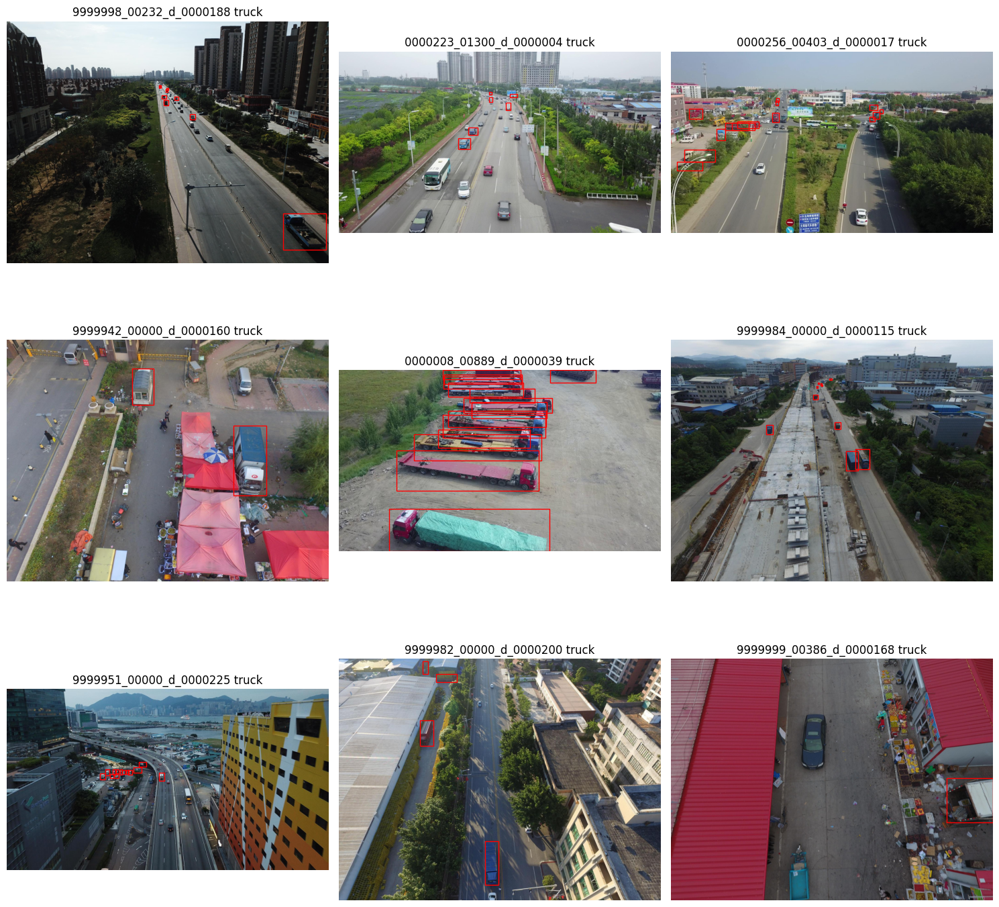

In [27]:
plot_images_for_class(df,'truck', images_dir, visdrone_classes)